<a href="https://colab.research.google.com/github/ihaveaword/clip/blob/main/notebooks/Interacting_with_CLIP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Interacting with CLIP

This is a self-contained notebook that shows how to download and run CLIP models, calculate the similarity between arbitrary image and text inputs, and perform zero-shot image classifications.

In [44]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Preparation for Colab

Make sure you're running a GPU runtime; if not, select "GPU" as the hardware accelerator in Runtime > Change Runtime Type in the menu. The next cells will install the `clip` package and its dependencies, and check if PyTorch 1.7.1 or later is installed.

In [45]:
! pip install ftfy regex tqdm
! pip install git+https://github.com/openai/CLIP.git

  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-s2gvsbq4
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-s2gvsbq4
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done


In [46]:
import numpy as np
import torch
from pkg_resources import packaging

print("Torch version:", torch.__version__)


Torch version: 2.6.0+cu124


# Loading the model

`clip.available_models()` will list the names of available CLIP models.

In [47]:
import clip

clip.available_models()

['RN50',
 'RN101',
 'RN50x4',
 'RN50x16',
 'RN50x64',
 'ViT-B/32',
 'ViT-B/16',
 'ViT-L/14',
 'ViT-L/14@336px']

In [48]:
device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("RN50")
model.load_state_dict(torch.load("/content/drive/Othercomputers/我的 Mac/contrastive learning/pretrained_weight/your model name_epoch_9.pth", map_location="cpu"))  # 加载您的权重
model = model.to(device)
model.cuda().eval()
input_resolution = model.visual.input_resolution
context_length = model.context_length
vocab_size = model.vocab_size

print("Model parameters:", f"{np.sum([int(np.prod(p.shape)) for p in model.parameters()]):,}")
print("Input resolution:", input_resolution)
print("Context length:", context_length)
print("Vocab size:", vocab_size)

Model parameters: 102,007,137
Input resolution: 224
Context length: 77
Vocab size: 49408


# Image Preprocessing

We resize the input images and center-crop them to conform with the image resolution that the model expects. Before doing so, we will normalize the pixel intensity using the dataset mean and standard deviation.

The second return value from `clip.load()` contains a torchvision `Transform` that performs this preprocessing.



In [49]:
preprocess

Compose(
    Resize(size=224, interpolation=bicubic, max_size=None, antialias=True)
    CenterCrop(size=(224, 224))
    <function _convert_image_to_rgb at 0x7bff74493ba0>
    ToTensor()
    Normalize(mean=(0.48145466, 0.4578275, 0.40821073), std=(0.26862954, 0.26130258, 0.27577711))
)

# Text Preprocessing

We use a case-insensitive tokenizer, which can be invoked using `clip.tokenize()`. By default, the outputs are padded to become 77 tokens long, which is what the CLIP models expects.

In [50]:
clip.tokenize("Hello World!")

tensor([[49406,  3306,  1002,   256, 49407,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0]], dtype=torch.int32)

# Setting up input images and texts

We are going to feed 8 example images and their textual descriptions to the model, and compare the similarity between the corresponding features.

The tokenizer is case-insensitive, and we can freely give any suitable textual descriptions.

In [51]:
#skimage.data.download_all(directory=None)

In [52]:
import os
import skimage
import IPython.display
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

from collections import OrderedDict
import torch

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

# images in skimage to use and their textual descriptions
descriptions = {
    "adjusting board": "an adjusting board used in power line equipment",
    "bird nest": "a bird nest found on power line structures",
    "composite insulator": "a composite insulator used in high-voltage power lines",
    "disc suspension insulator": "a disc suspension insulator for power transmission",
    "foreign body": "a foreign object on power line equipment",
    "glass insulator with coating": "a glass insulator with protective coating",
    "glass insulator without coating": "a glass insulator without coating",
    "grading ring": "a grading ring for electric field control",
    "grading ring damage": "a damaged grading ring on power equipment",
    "insulator bunch-drop": "a dropped or broken bunch of insulators",
    "insulator damage": "a damaged power line insulator",
    "lc-type yoke plate": "an LC-type yoke plate for power line hardware",
    "normal bolt": "a standard bolt used in power line assembly",
    "nut losing bolt": "a bolt with a missing or loose nut",
    "pin losing bolt": "a bolt with a missing or loose pin",
    "pre-twisted suspension clamp": "a pre-twisted suspension clamp for conductors",
    "shielded ring": "a shielded ring on power line equipment",
    "shielded ring corrosion": "a corroded shielded ring",
    "shock hammer": "a shock hammer used in power line maintenance",
    "shockproof hammer intersection": "a shockproof hammer at an intersection point",
    "suspension clamp": "a suspension clamp for overhead power lines",
    "triangle yoke plate": "a triangular yoke plate for power line hardware",
    "weight": "a counterweight used in power line systems",
    "yoke plate": "a yoke plate for power line hardware assembly"
}


Loaded: 21573.jpg from adjusting board
Loaded: 20268.jpg from bird nest
Loaded: 19888.jpg from composite insulator
Loaded: 19243.jpg from disc suspension insulator
Loaded: 20474.jpg from foreign body
Loaded: 20563.jpg from glass insulator with coating
Loaded: 19961.jpg from glass insulator without coating
Loaded: 21466.jpg from grading ring
Loaded: 21330.jpg from grading ring damage
Loaded: 21393.jpg from insulator bunch-drop
Loaded: 21898.jpg from insulator damage
Loaded: 21709.jpg from lc-type yoke plate
Loaded: 20137.jpg from normal bolt
Loaded: 21168.jpg from nut losing bolt
Loaded: 19404.jpg from pin losing bolt
Loaded: 22778.jpg from pre-twisted suspension clamp
Loaded: 18968.jpg from shielded ring
Loaded: 18751.jpg from shielded ring corrosion
Loaded: 21394.jpg from shock hammer
Loaded: 20836.jpg from shockproof hammer intersection
Loaded: 21934.jpg from suspension clamp
Loaded: 20753.jpg from triangle yoke plate
Loaded: 21085.jpg from weight
Loaded: 20216.jpg from yoke plate


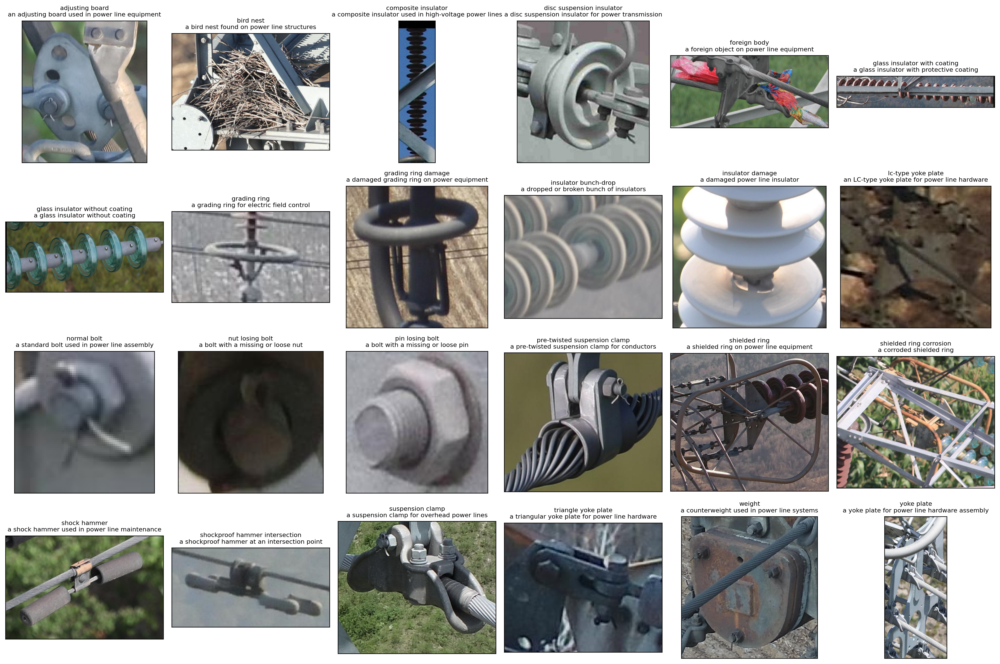

In [53]:

original_images = []
images = []
texts = []

# 计算需要的行列数（23个类别）
total_categories = len(descriptions)
cols = 6  # 每行6个图片
rows = (total_categories + cols - 1) // cols  # 向上取整
plt.figure(figsize=(18, rows * 3))

# 测试数据集根目录
test_data_dir = "/content/drive/MyDrive/VLPdataset/test"

# 按照descriptions的顺序遍历每个类别
for category_name in descriptions.keys():
    category_folder = os.path.join(test_data_dir, category_name)

    # 检查文件夹是否存在
    if not os.path.exists(category_folder):
        print(f"Warning: Folder {category_folder} does not exist, skipping...")
        continue

    # 获取该类别文件夹中的所有图片文件
    image_files = [f for f in os.listdir(category_folder)
                   if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

    # 如果文件夹中没有图片，跳过
    if not image_files:
        print(f"Warning: No images found in {category_folder}, skipping...")
        continue

    # 随机选择一张图片
    selected_image = random.choice(image_files)
    image_path = os.path.join(category_folder, selected_image)

    try:
        image = Image.open(image_path).convert("RGB")

        plt.subplot(rows, cols, len(images) + 1)
        plt.imshow(image)
        plt.title(f"{category_name}\n{descriptions[category_name]}", fontsize=8)
        plt.xticks([])
        plt.yticks([])

        original_images.append(image)
        images.append(preprocess(image))
        texts.append(descriptions[category_name])

        print(f"Loaded: {selected_image} from {category_name}")

    except Exception as e:
        print(f"Error loading image {image_path}: {e}")
        continue

plt.tight_layout()
plt.show()

## Building features

We normalize the images, tokenize each text input, and run the forward pass of the model to get the image and text features.

In [54]:
image_input = torch.tensor(np.stack(images)).cuda()
text_tokens = clip.tokenize(["This is " + desc for desc in texts]).cuda()

In [55]:
with torch.no_grad():
    image_features = model.encode_image(image_input).float()
    text_features = model.encode_text(text_tokens).float()

## Calculating cosine similarity

We normalize the features and calculate the dot product of each pair.

In [56]:
image_features /= image_features.norm(dim=-1, keepdim=True)
text_features /= text_features.norm(dim=-1, keepdim=True)
similarity = text_features.cpu().numpy() @ image_features.cpu().numpy().T

Text(0.5, 1.0, 'Cosine similarity between text and image features')

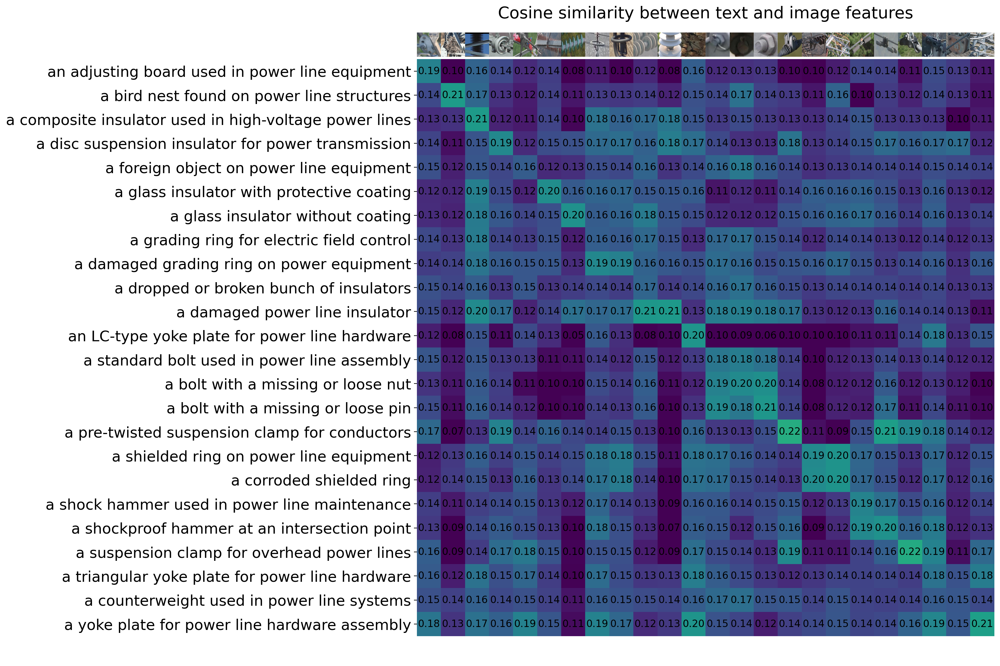

In [57]:
count = len(descriptions)

plt.figure(figsize=(20, 14))
plt.imshow(similarity, vmin=0.1, vmax=0.3)
# plt.colorbar()
plt.yticks(range(count), texts, fontsize=18)
plt.xticks([])
for i, image in enumerate(original_images):
    plt.imshow(image, extent=(i - 0.5, i + 0.5, -1.6, -0.6), origin="lower")
for x in range(similarity.shape[1]):
    for y in range(similarity.shape[0]):
        plt.text(x, y, f"{similarity[y, x]:.2f}", ha="center", va="center", size=12)

for side in ["left", "top", "right", "bottom"]:
  plt.gca().spines[side].set_visible(False)

plt.xlim([-0.5, count - 0.5])
plt.ylim([count + 0.5, -2])

plt.title("Cosine similarity between text and image features", size=20)

# Zero-Shot Image Classification

You can classify images using the cosine similarity (times 100) as the logits to the softmax operation.

In [58]:
# 提取图像特征
image_input = torch.tensor(np.stack(images)).to(device)
with torch.no_grad():
    image_features = model.encode_image(image_input).float()
    image_features /= image_features.norm(dim=-1, keepdim=True)

# 使用您自己的类别描述而不是CIFAR100
text_descriptions = list(descriptions.values())  # 使用您的descriptions
text_tokens = clip.tokenize(text_descriptions).to(device)


In [59]:
with torch.no_grad():
    text_features = model.encode_text(text_tokens).float()
    text_features /= text_features.norm(dim=-1, keepdim=True)

text_probs = (100.0 * image_features @ text_features.T).softmax(dim=-1)
top_probs, top_labels = text_probs.cpu().topk(5, dim=-1)

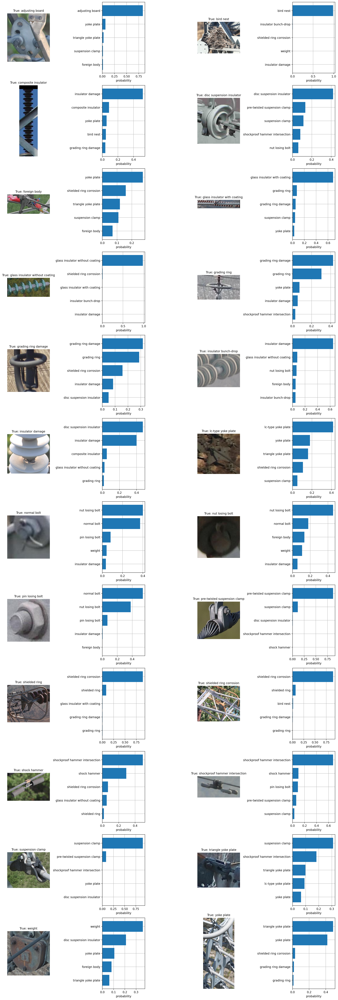

In [60]:
# 计算布局以适应所有图片（每张图片需要2个位置：图片+柱状图）
num_images = len(original_images)
cols = 4  # 每行4个位置
rows = (num_images * 2 + cols - 1) // cols  # 每张图片需要2个位置
plt.figure(figsize=(16, rows * 4))

category_names = list(descriptions.keys())

for i, image in enumerate(original_images):
    # 显示图片
    plt.subplot(rows, cols, 2 * i + 1)
    plt.imshow(image)
    plt.axis("off")
    plt.title(f"True: {category_names[i]}", fontsize=10)

    # 显示预测概率柱状图
    plt.subplot(rows, cols, 2 * i + 2)
    y = np.arange(top_probs.shape[-1])
    plt.grid()
    plt.barh(y, top_probs[i])
    plt.gca().invert_yaxis()
    plt.gca().set_axisbelow(True)

    # 安全地获取类别名称，避免索引超出范围
    top_category_names = []
    for index in top_labels[i].numpy():
        if index < len(category_names):
            top_category_names.append(category_names[index])
        else:
            top_category_names.append(f"Unknown_{index}")

    plt.yticks(y, top_category_names)
    plt.xlabel("probability")

plt.tight_layout()
plt.show()